# Inverse (complex) constant-Q transform

This notebook implements an inverse CQT using the method described by [Schoerkhuber and Klapuri](http://smcnetwork.org/files/proceedings/2010/48.pdf) and the [complex-cqt](https://github.com/bmcfee/librosa/pull/279) branch of librosa.

There are still some bugs to shake out to achieve the SNR levels reported in the original paper, probably owing to discrepancies in the forward cqt implementation.  However, the inverse sounds pretty good even with low scores.

To keep things readable, I use the [presets](https://pypi.python.org/pypi/presets) module.

This notebook has been updated to the most recent batch of CQT fixes implemented in [PR #347](https://github.com/bmcfee/librosa/pull/347)

In [8]:
!pip install presets
from google.colab import drive
drive.mount("/content/gdrive")  

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import librosa as _librosa
import librosa.display as _display
_librosa.display = _display
from presets import Preset
import numpy as np
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import mir_eval
sns.set(style='ticks')

In [0]:
from IPython.display import Audio

In [0]:
librosa = Preset(_librosa)
librosa['sr'] = 44100
librosa['hop_length'] = 128
librosa['scale'] = True

In [0]:
def icqt_recursive(C, sr=22050, hop_length=512, fmin=None, bins_per_octave=12, filter_scale=None, norm=1, scale=True, window='hann'):
    
    n_octaves = int(np.ceil(float(C.shape[0]) / bins_per_octave))


    if fmin is None:
        fmin = librosa.note_to_hz('C1')
    
    freqs = librosa.cqt_frequencies(C.shape[0], fmin,
                            bins_per_octave=bins_per_octave)[-bins_per_octave:]

    fmin_t = np.min(freqs)
    fmax_t = np.max(freqs)

    # Make the filter bank
    f, lengths = librosa.filters.constant_q(sr=sr,
                                            fmin=fmin_t,
                                            n_bins=bins_per_octave,
                                            bins_per_octave=bins_per_octave,
                                            filter_scale=filter_scale,
                                            norm=norm, window=window)
    
    if scale:
        f = f / np.sqrt(lengths[:, np.newaxis])
    
    else:
        f = f / lengths[:, np.newaxis]
        
    n_trim = f.shape[1] // 2
    
    # Hermitian the filters and sparsify
    f = librosa.util.sparsify_rows(f)
    
    y = None
    
    for octave in range(n_octaves - 1, -1, -1):
    
        # Compute the slice index for the current octave
        slice_ = slice(-(octave+1) * bins_per_octave - 1, -(octave) * bins_per_octave - 1)
        
        # Project onto the basis        
        C_ = C[slice_]
        fb = f[-C_.shape[0]:] #/ np.sqrt(lengths[-C_.shape[0]:, np.newaxis])
        Cf = fb.conj().T.dot(C_) 
        
        # Overlap-add the responses
        y_oct = np.zeros(int(f.shape[1] + (2**(-octave) *  hop_length * C.shape[1])), dtype=f.dtype)
        for i in range(Cf.shape[1]):
            y_oct[int(i * hop_length * 2**(-octave)):int(i * hop_length * 2**(-octave) + Cf.shape[0])] += Cf[:, i]
        
        if y is None:
            y = y_oct
            continue

        # Up-sample the previous buffer and add in the new one
        y = (librosa.core.resample(y.real, 1, 2, scale=True) + 
             1.j * librosa.core.resample(y.imag, 1, 2, scale=True))
        
        y = y[n_trim:-n_trim] / 2 + y_oct
        
    # Chop down the length
    y = librosa.util.fix_length(y.real, f.shape[1] + hop_length * C.shape[1])
    
    
    y *= 2**n_octaves
    
        
    # Trim off the center-padding
    return np.ascontiguousarray(y[n_trim : -n_trim])

icqt = icqt_recursive

In [0]:
y, sr = librosa.load(librosa.util.example_audio_file(),
                     offset=5, duration=25)
#y, sr = librosa.load('/home/bmcfee/working/Battles - Tonto-it1CCNCHPc0.mp3',
#                     offset=300, duration=30)
#y, sr = librosa.load('/home/bmcfee/working/Conlon Nancarrow, Study for Player Piano No. 21 (Canon X)-f2gVhBxwRqg.m4a',
#                     duration=30, offset=60)

In [0]:
over_sample = 3
res_factor = 1
y
C = librosa.cqt(y, sr=sr, hop_length=librosa['hop_length'], bins_per_octave=int(12*over_sample), n_bins=int(8 * 12 * over_sample), filter_scale=res_factor, fmin=librosa.note_to_hz('C1'), scale=True)

# TODO

- Implement `scale` for icqt

In [0]:
y2 = icqt(C, sr=sr,
          hop_length=librosa['hop_length'],
          bins_per_octave=int(12 * over_sample),
          filter_scale=res_factor,
          fmin=librosa.note_to_hz('C1'),
         scale=True)

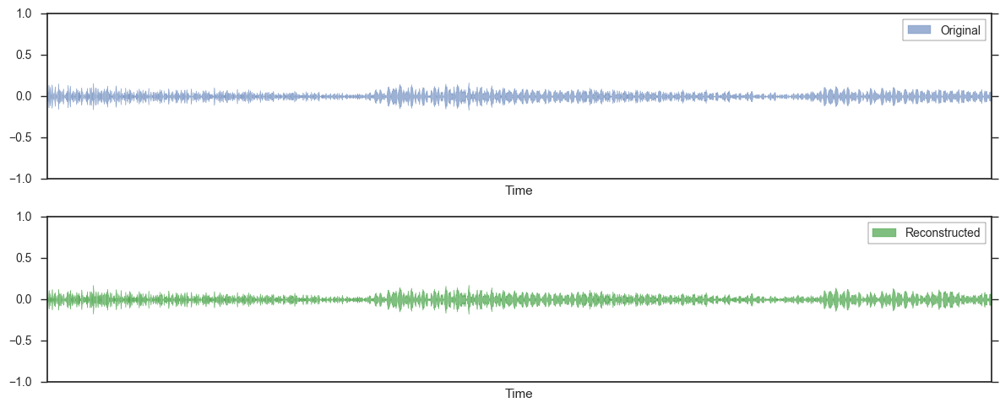

In [0]:
plt.figure(figsize=(12, 5))
plt.subplot(2,1,1)
librosa.display.waveplot(y[:sr], alpha=0.55, label='Original')
plt.legend(frameon=True)
plt.xticks([])
plt.ylim([-1, 1])

plt.subplot(2,1,2)
librosa.display.waveplot(np.ascontiguousarray(y2)[:sr], alpha=0.5, label='Reconstructed', color='g')
plt.xticks([])
plt.ylim([-1, 1])
plt.legend(frameon=True)


plt.tight_layout()

In [0]:
# We can trim back down to the original length easily enough
y2 = librosa.util.fix_length(y2, len(y))

In [0]:
C2 = librosa.cqt(y2,
                sr=sr,
                hop_length=librosa['hop_length'],
                bins_per_octave=int(12*over_sample),
                n_bins=C.shape[0],
                real=False,
                filter_scale=res_factor, 
                fmin=librosa.note_to_hz('C1'),
                scale=True)

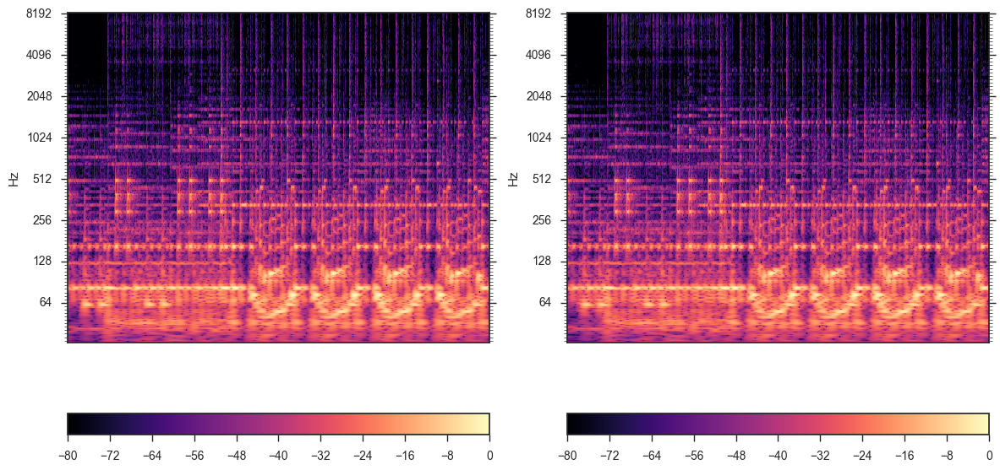

In [0]:
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
librosa.display.specshow(librosa.logamplitude(C**2, ref_power=np.max, top_db=80),
                         bins_per_octave=int(12*over_sample),
                         y_axis='cqt_hz', cmap='magma', vmin=-80, vmax=0)
plt.colorbar(orientation='horizontal')
plt.subplot(1,2,2)
librosa.display.specshow(librosa.logamplitude(C2**2, ref_power=np.max, top_db=80),
                         bins_per_octave=int(12*over_sample),
                         y_axis='cqt_hz', cmap='magma', vmin=-80, vmax=0)
plt.colorbar(orientation='horizontal')
plt.tight_layout()

In [0]:
# Original signal

Audio(y, rate=sr)

In [0]:
# Reconstructed signal.  It's obviously been low-pass filtered, but otherwise sounds reasonable.

Audio(y2, rate=sr)

In [0]:
Audio(y - y2, rate=sr)

In [0]:
melspec = librosa.feature.melspectrogram(y, sr=sr)
melspec2 = librosa.feature.melspectrogram(y2, sr=sr)

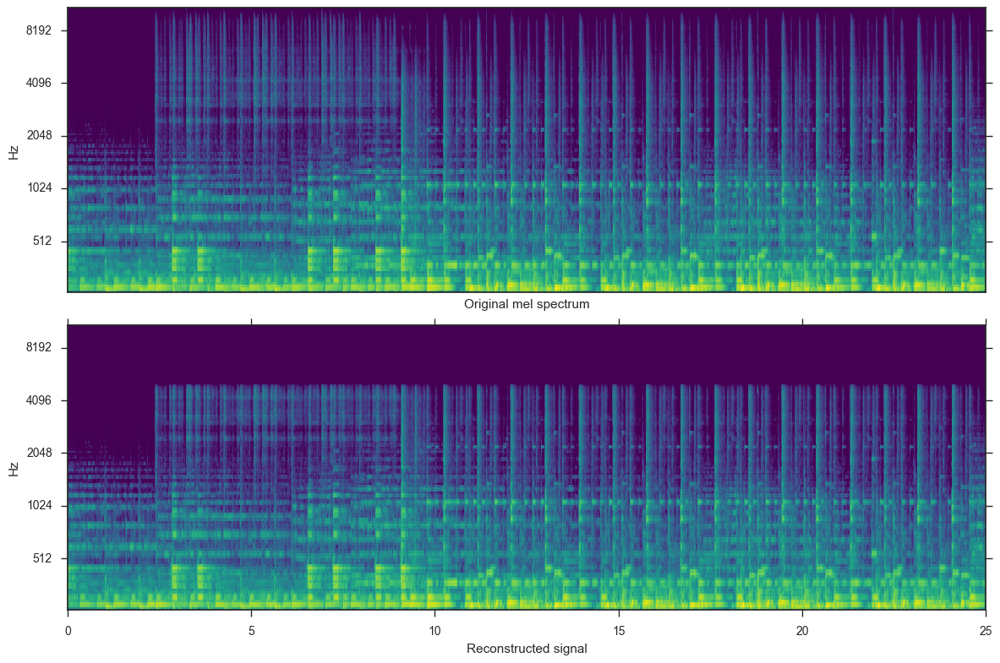

In [0]:
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.logamplitude(melspec, ref_power=np.max), y_axis='mel',
                         sr=sr, cmap='viridis')
plt.xlabel('Original mel spectrum')

plt.subplot(2,1,2)
librosa.display.specshow(librosa.logamplitude(melspec2, ref_power=np.max),  y_axis='mel', sr=sr,
                         cmap='viridis', x_axis='time')
plt.xlabel('Reconstructed signal')

plt.tight_layout()


In [0]:
sr_max = librosa.cqt_frequencies(n_bins=C.shape[0],
                        fmin=librosa.note_to_hz('C1'),
                        bins_per_octave=int(12*over_sample))[-1] * 2

In [0]:
y_filt = librosa.resample(librosa.resample(y, sr, sr_max), sr_max, sr)

In [0]:
mir_eval.separation.evaluate(y[np.newaxis, :], y2[np.newaxis, :])

OrderedDict([('Images - Source to Distortion', [12.982889839272255]),
             ('Images - Image to Spatial', [21.255442520035125]),
             ('Images - Source to Interference', [inf]),
             ('Images - Source to Artifact', [13.726777356702414]),
             ('Images - Source permutation', [0]),
             ('Images Frames - Source to Distortion', [[12.982889839272255]]),
             ('Images Frames - Image to Spatial', [[21.255442520035125]]),
             ('Images Frames - Source to Interference', [[inf]]),
             ('Images Frames - Source to Artifact', [[13.726777356702414]]),
             ('Images Frames - Source permutation', [[0]]),
             ('Sources Frames - Source to Distortion', [[13.726777356702414]]),
             ('Sources Frames - Source to Interference', [[inf]]),
             ('Sources Frames - Source to Artifact', [[13.726777356702414]]),
             ('Sources Frames - Source permutation', [[0]]),
             ('Sources - Source to Distortion

In [0]:
mir_eval.separation.evaluate(y_filt[np.newaxis, :len(y2)], y2[np.newaxis, :])

OrderedDict([('Images - Source to Distortion', [13.036732941021445]),
             ('Images - Image to Spatial', [21.369810272566617]),
             ('Images - Source to Interference', [inf]),
             ('Images - Source to Artifact', [13.753016568765444]),
             ('Images - Source permutation', [0]),
             ('Images Frames - Source to Distortion', [[13.036732941021445]]),
             ('Images Frames - Image to Spatial', [[21.369810272566617]]),
             ('Images Frames - Source to Interference', [[inf]]),
             ('Images Frames - Source to Artifact', [[13.753016568765444]]),
             ('Images Frames - Source permutation', [[0]]),
             ('Sources Frames - Source to Distortion', [[13.753016568765444]]),
             ('Sources Frames - Source to Interference', [[inf]]),
             ('Sources Frames - Source to Artifact', [[13.753016568765444]]),
             ('Sources Frames - Source permutation', [[0]]),
             ('Sources - Source to Distortion